3. Simulate a dataset for Classification with 3 Labels, 6 attributes with interaction among them, 10000 instances and use Uniform random function

In [ ]:
import numpy as np
import pandas as pd

x_classification = np.random.uniform(0,10 , size=(10000,6))
x_classification

terms_interaction = np.array([(x_classification[:,0] * x_classification[:,1]*0.3) +
                     (x_classification[:,2] - x_classification[:,3]) +
                      (x_classification[:,4] + x_classification[:,5])])

print('interaction terms :', terms_interaction)
terms_interaction.shape

ranges = np.linspace(np.min(terms_interaction), np.max(terms_interaction), 4)
labels = np.digitize(terms_interaction, ranges)-1


# min(np.unique(labels))
# max(np.unique(labels))

df_classification = pd.DataFrame(x_classification, columns=[f"Column{i+1}" for i in range(6)])

df_classification.head()
df_classification['Target']= labels.reshape(-1,1)
df_classification.head()


interaction terms : [[16.41184631 18.35443737 10.1569778  ... 21.35973655  5.46890482
  22.01402793]]


,Column1,Column2,Column3,Column4,Column5,Column6,Target
0,8.441280,2.445899,2.327388,4.493160,7.226904,5.156759,1
1,5.072964,2.853611,9.599138,7.489196,8.231876,3.669739,1
2,0.315132,9.020475,6.698920,5.751350,8.033515,0.323101,0
3,6.505979,8.743771,3.225829,9.553259,8.039283,7.963418,1
4,3.701257,0.258448,6.111780,3.562143,9.476482,4.948633,1


4. Simulate a dataset for regression 6 attributes with interaction among them, 10000 instances and use normal random function

In [ ]:
x_regression = np.random.normal(0,1 , size=(10000,6))
x_regression

interaction = np.array(
    1.5*x_regression[:,0] + 2*x_regression[:,1] + 0.5*x_regression[:,4] + np.cos(x_regression[:,2])
)
interaction

df_regression = pd.DataFrame(x_regression, columns=[f"Column{i+1}" for i in range(6)])

df_regression.head()
df_regression['Target']= interaction.reshape(-1,1)
df_regression.head()

,Column1,Column2,Column3,Column4,Column5,Column6,Target
0,-1.375211,1.638725,-0.281547,0.597238,-0.357892,-0.919900,1.996316
1,0.930394,-1.901036,1.722742,-0.038109,0.873155,-0.395441,-2.121265
2,0.870449,0.608114,-0.792176,0.691232,-0.798493,-0.278424,2.824953
3,0.593469,-0.194409,0.665444,1.490917,-0.334127,0.787913,1.120963
4,1.327815,-0.527405,1.747967,-0.582035,0.687366,0.379346,1.104351


5. Simulate a dataset for Clustering 6 attributes with interaction among them, 10000 instances and use normal random function.

In [ ]:
x_clustering = np.random.normal(0,10 , size=(10000,6))

x_clustering[1] = x_clustering[1] + 0.4*x_clustering[0]
x_clustering[2]= x_clustering[2]*0.2*x_clustering[3]
x_clustering[5] = x_clustering[5]+ x_clustering[4]*0.5

df_clsutering = pd.DataFrame(x_clustering, columns=[f"Column{i+1}" for i in range(6)])
df_clsutering.head()

,Column1,Column2,Column3,Column4,Column5,Column6
0,-11.273782,-14.050640,4.332972,4.179863,-5.484719,-2.732117
1,-18.903419,-13.855669,-4.275198,7.653469,5.222919,-2.790704
2,3.253064,-1.737024,-7.629830,42.083545,-21.156678,10.691393
3,5.160815,5.893403,4.467217,-12.844833,-18.732203,5.853645
4,-9.958271,-6.404282,9.950782,-18.230399,2.981594,4.622581


6. Build a Non Linear Regression model and get 90% Accuracy for the above simulated data in question2. Split the data into 70% and 30% respectively for Training and Testing for model building

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures

x_re = df_regression.drop('Target', axis=1)
y_re = df_regression['Target']

x_train_re , x_test_re , y_train_re , y_test_re = train_test_split(x_re, y_re, test_size=0.3, random_state=5)

poly = PolynomialFeatures(degree=2,include_bias=False)
poly_features = poly.fit_transform(x_train_re)
poly_test_features = poly.transform(x_test_re)

model = LinearRegression()
model.fit(poly_features, y_train_re)

y_pred_re = model.predict(poly_test_features)
mse = mean_squared_error(y_test_re, y_pred_re)
print("Mean Squared Error:", mse)

print('Training score  :', model.score(poly_features, y_train_re))
print('testing score :', model.score(poly_test_features, y_test_re))

Mean Squared Error: 0.012507103610156205
Training score  : 0.997722253350124
testing score : 0.9980673842090089


7. Build any five Classifiers for the above dataset in question1 and compare the metrics of these built models. Metrics need to build are Accuracy, Precision, Recall, F1Score. Split the data into 70% and 30% respectively for Training and Testing for model building

 Decision trees

In [ ]:
# decision trees
# df_classification

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# here cls means : classification
# diving dataset and using same division for all classification models

x_cls = df_classification.drop('Target', axis=1)
y_cls = df_classification['Target']

x_train_cls , x_test_cls , y_train_cls , y_test_cls = train_test_split(x_cls, y_cls, test_size=0.3, random_state=5)

dct = DecisionTreeClassifier(random_state=1)
model_dct = dct.fit(x_train_cls, y_train_cls)

y_pred_cls_dct = model_dct.predict(x_test_cls)
print('accuracy score :', accuracy_score(y_test_cls, y_pred_cls_dct),'\n\n')
print('confusion matrix :\n', confusion_matrix(y_test_cls, y_pred_cls_dct))
print('\n\nclassification report \n', classification_report(y_test_cls, y_pred_cls_dct))

accuracy score : 0.834 


confusion matrix :
 [[ 884  183    0    0]
 [ 199 1518   55    0]
 [   0   60  100    0]
 [   0    0    1    0]]


classification report 
               precision    recall  f1-score   support

           0       0.82      0.83      0.82      1067
           1       0.86      0.86      0.86      1772
           2       0.64      0.62      0.63       160
           3       0.00      0.00      0.00         1

    accuracy                           0.83      3000
   macro avg       0.58      0.58      0.58      3000
weighted avg       0.83      0.83      0.83      3000



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# random forest classifier
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(random_state=3)
model_rfc = rfc.fit(x_train_cls , y_train_cls)
y_pred_cls_rfc = model_rfc.predict(x_test_cls)

print('accuracy score :', accuracy_score(y_test_cls, y_pred_cls_rfc))
print('\n\nconfusion matrix :\n', confusion_matrix(y_test_cls, y_pred_cls_rfc))

accuracy score : 0.9233333333333333


confusion matrix :
 [[ 970   97    0    0]
 [  67 1702    3    0]
 [   0   62   98    0]
 [   0    0    1    0]]


In [ ]:
# naive bayes classifier
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
model_gnb = gnb.fit(x_train_cls , y_train_cls)

y_pred_cls_gnb = model_gnb.predict(x_test_cls)
print('accuracy score :',accuracy_score(y_test_cls, y_pred_cls_gnb))
print('\n\nconfusion matrix :\n', confusion_matrix(y_test_cls, y_pred_cls_gnb))
print('classification repore :',classification_report(y_test_cls , y_pred_cls_gnb))

accuracy score : 0.8843333333333333


confusion matrix :
 [[ 822  245    0    0]
 [  22 1746    4    0]
 [   0   75   85    0]
 [   0    0    1    0]]
classification repore :               precision    recall  f1-score   support

           0       0.97      0.77      0.86      1067
           1       0.85      0.99      0.91      1772
           2       0.94      0.53      0.68       160
           3       0.00      0.00      0.00         1

    accuracy                           0.88      3000
   macro avg       0.69      0.57      0.61      3000
weighted avg       0.90      0.88      0.88      3000



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

knn = KNeighborsClassifier(n_neighbors=5)
sc = StandardScaler()
x_train_cls_scaled = sc.fit_transform(x_train_cls)
x_test_cls_scaled = sc.transform(x_test_cls)
model_knn = knn.fit(x_train_cls_scaled, y_train_cls)
y_pred_cls_knn = model_knn.predict(x_test_cls_scaled)

print('accuracy score :',accuracy_score(y_test_cls, y_pred_cls_knn))
print('\n\nconfusion mat :\n', confusion_matrix(y_test_cls, y_pred_cls_knn))
print('\n\nclassification report :',classification_report(y_test_cls , y_pred_cls_knn))

accuracy score : 0.9233333333333333


confusion mat :
 [[ 972   95    0    0]
 [  81 1682    9    0]
 [   0   44  116    0]
 [   0    0    1    0]]


classification report :               precision    recall  f1-score   support

           0       0.92      0.91      0.92      1067
           1       0.92      0.95      0.94      1772
           2       0.92      0.72      0.81       160
           3       0.00      0.00      0.00         1

    accuracy                           0.92      3000
   macro avg       0.69      0.65      0.67      3000
weighted avg       0.92      0.92      0.92      3000



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


 SVC

In [ ]:
from sklearn.svm import SVC

svc = SVC(kernel='linear')
model_svc = svc.fit(x_train_cls , y_train_cls)

y_pred_cls_svc = model_svc.predict(x_test_cls)
print('accuracy score :',accuracy_score(y_test_cls, y_pred_cls_svc))
print('\n\nconfusion mat :\n', confusion_matrix(y_test_cls, y_pred_cls_svc))
print('\n\nclassification report :',classification_report(y_test_cls , y_pred_cls_svc))

accuracy score : 0.9276666666666666


confusion mat :
 [[ 956  111    0    0]
 [  87 1676    9    0]
 [   0    9  151    0]
 [   0    0    1    0]]


classification report :               precision    recall  f1-score   support

           0       0.92      0.90      0.91      1067
           1       0.93      0.95      0.94      1772
           2       0.94      0.94      0.94       160
           3       0.00      0.00      0.00         1

    accuracy                           0.93      3000
   macro avg       0.70      0.70      0.70      3000
weighted avg       0.93      0.93      0.93      3000



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


8. Load CSV, EXCEL, EXCELS, JSON format datasets from local host and Websites into Colab interface and split them into Train and test data.

In [75]:
# CSV files  from local host

csv_ = pd.read_csv('/content/weight-height.csv')
csv_.head()

# splitting datste
x_csv = csv_.drop('Weight', axis=1)
y_csv = csv_['Weight']

x_train_csv , x_test_csv , y_train_csv , y_test_csv = train_test_split(x_csv, y_csv, test_size=0.3, random_state=5)
print('\ntrain set (x) :\n', x_train_csv.head())
print('\ntrain set (y) :\n', y_train_csv.head())
print('\ntest set (x) :\n', x_test_csv.head())
print('\ntest set (y) :\n', y_test_csv.head())


train set (x) :
       Gender     Height
2926    Male  71.702390
4634    Male  67.656893
416     Male  66.634691
6369  Female  66.985923
7952  Female  61.190837

train set (y) :
 2926    199.946155
4634    192.121524
416     190.467959
6369    142.920389
7952    132.977179
Name: Weight, dtype: float64

test set (x) :
       Gender     Height
7054  Female  64.228870
442     Male  73.530285
3954    Male  74.350444
2288    Male  68.783873
3196    Male  64.639449

test set (y) :
 7054    140.997715
442     222.925917
3954    204.412960
2288    187.635464
3196    165.071397
Name: Weight, dtype: float64


In [80]:
# excel files form local host

xls_ = pd.read_excel('/content/SPOC contact Details.xlsx')
xls_.head()
x_xls = xls_.drop('Email', axis=1)
y_xls = xls_['Email']

x_train_xls , x_test_xls , y_train_xls , y_test_xls = train_test_split(x_xls , y_xls , test_size=0.3 , random_state=5)

print('\nTrain data (x)\n', x_train_xls.head())
print('\nTrain data (y)\n', y_train_xls.head())
print('\nTest data (x)\n', x_test_xls.head())
print('\nTest data (y)\n', y_test_xls.head())


Train data (x)
     Sno       Name of the Faculty Deapartment     Certification programme  \
13   14              Sri U Sairam          IT                         RPA   
12   13  Sri Md Ziauddin Jahangir         ECE                  Salesforce   
10   11              Dr K Radhika        AIDS       Google Certifications   
0     1               Sri A Mohan         CSE  All Infosys Certifications   
11   12              Ms I Srujana         CSE                      PEGA,    

                Contact No  
13              8143364133  
12              9885717845  
10              9346253642  
0   9948289684\n9666992628  
11              9989166622  

Train data (y)
 13                               usairam_it@cbit.ac.in
12                             jahangir_ece@cbit.ac.in
10    kradhika_aids@cbit.ac.in; kradhika_it@cbit.ac.in
0                                amohan_cse@cbit.ac.in
11                             isrujana_cse@cbit.ac.in
Name: Email, dtype: object

Test data (x)
     Sno Nam

In [85]:
# csv from website
import pandas as pd
url = 'https://abcd.com/data.csv'

df = pd.read_csv(url)

from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df, test_size=0.2, random_state=4)

print(train_df.head())
print(test_df.head())

# excel file

import pandas as pd

# Excel file URL
url = 'https://haha.com/data.xlsx'
df_excel= pd.read_excel(url)

print(df_excel.head())

train_df, test_df = train_test_split(df_excel, test_size=0.2, random_state=42)

print(train_df.head())
print(test_df.head())

# json
# csv from website
import pandas as pd
url = 'https://abcd.com/data.csv'

df = pd.read_csv(url)

from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df, test_size=0.2, random_state=4)

print(train_df.head())
print(test_df.head())

# excel file

import pandas as pd

# Excel file URL
url = 'https://haha.com/data.json'
df_json= pd.read_excel(url)

print(df_json.head())

train_df, test_df = train_test_split(df_json, test_size=0.2, random_state=42)

print(train_df.head())
print(test_df.head())



9. Load different datasets from SkLearn library into Colab interface and split them into train and
test data. Apply Normalization techniques to convert input data into standardize.

In [91]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

iris = load_iris()
f1 = iris.data
t1 = iris.target

x_train , x_test , y_train , y_test = train_test_split(f1 , t1 , test_size=0.3 , random_state=5)
sc = StandardScaler()
x_train_sc = sc.fit_transform(x_train)
x_test_sc = sc.transform(x_test)

print('train set (x) :\n', x_train_sc[1:8])
print('\ntrain set (y) :\n', y_train[1:8])
print('\ntest set (x) :\n', x_test_sc[1:8])

# min-max-sclaer
from sklearn.preprocessing import MinMaxScaler
mm = MinMaxScaler()
x_train_mm = mm.fit_transform(x_train)
x_test_mm = mm.transform(x_test)

print('train set (x) :\n', x_train_mm[1:8])
print('\ntrain set (y) :\n', y_train[1:8])
print('\ntest set (x) :\n', x_test_mm[1:8])

train set (x) :
 [[ 0.05427816 -0.14129125  0.24541088  0.39461145]
 [ 1.00414589  0.51321968  1.09119236  1.17885502]
 [ 2.19148056  1.60407122  1.65504668  1.30956228]
 [-0.53938918  0.73138999 -1.16422492 -1.30458296]
 [ 0.52921202 -1.23214279  0.69649434  0.9174405 ]
 [-1.01432305  0.29504937 -1.44615208 -1.30458296]
 [-1.48925692  0.73138999 -1.33338121 -1.1738757 ]]

train set (y) :
 [1 2 2 0 2 0 0]

test set (x) :
 [[ 0.29174509 -1.01397248  1.03480693  0.26390419]
 [-0.06445531 -0.57763186  0.75287977  1.57097681]
 [-1.72672385  0.29504937 -1.38976665 -1.30458296]
 [ 1.59781323  1.1677306   1.31673409  1.70168407]
 [-1.13305651 -1.4503131  -0.26205801 -0.25892486]
 [-1.13305651 -0.14129125 -1.33338121 -1.30458296]
 [ 0.05427816  0.29504937  0.58372347  0.78673323]]
train set (x) :
 [[0.44444444 0.41666667 0.54237288 0.58333333]
 [0.66666667 0.54166667 0.79661017 0.83333333]
 [0.94444444 0.75       0.96610169 0.875     ]
 [0.30555556 0.58333333 0.11864407 0.04166667]
 [0.5555555

In [191]:
import pandas as pd


url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/iris.csv"
df = pd.read_csv(url, header=None)
df.columns = ['sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'class']

# a. Split the data into features and target
X = df.drop('class', axis=1)
y = df['class']

# b. Merge (creating a copy of df and merging)
df_copy = df.copy()
merged_df = pd.merge(df, df_copy, on="sepal_length", how="inner")

# c. Select rows by conditions
selected_rows = df[df['sepal_length'] > 5.0]

# d. Select columns by conditions
selected_columns = df.loc[:, df.columns.str.contains('petal')]

# e. Rename columns
df_renamed = df.rename(columns={'sepal_length': 'sl', 'sepal_width': 'sw', 'petal_length': 'pl', 'petal_width': 'pw'})

# f. Min, max, avg, variance
min_value = df['sepal_length'].min()
max_value = df['sepal_length'].max()
avg_value = df['sepal_length'].mean()
variance_value = df['sepal_length'].var()

# g. Describe
description = df.describe()

# h. Size
size = df.size

# i. Shape
shape = df.shape

# j. Find unique values
unique_values = df['class'].unique()


# l. Replace attribute value (replace 'Iris-setosa' with 'Setosa')
df_replaced = df.replace({'class': {'Iris-setosa': 'Setosa'}})

# m. Delete columns
df_deleted_columns = df.drop(columns=['petal_width'])

# n. Delete rows
df_deleted_rows = df.drop(df[df['sepal_length'] < 5.0].index)

# o. Join datasets (left join example)
df_left_join = pd.merge(df, df_copy, on="petal_length", how="left")

# p. Group values by rows
grouped_by_class = df.groupby('class').mean()

# q. Loop over columns
for col in df.columns:
    print(f"Column: {col}")

# r. Group rows by time (simulated by adding date)
df['Date'] = pd.date_range('20230101', periods=len(df))
df_group_by_time = df.groupby(df['Date'].dt.month)

# s. Concatenating datasets
concatenated_df = pd.concat([df, df_copy], axis=0)

# t. Append rows
df_appended = pd.concat([df, df_copy], ignore_index=True)

# u. Append columns
df_appended_columns = pd.concat([df, df_copy[['sepal_length']]], axis=1)

# w. Reorder columns
df_reordered = df[['class', 'sepal_length', 'petal_length', 'sepal_width', 'petal_width']]


Column: sepal_length
Column: sepal_width
Column: petal_length
Column: petal_width
Column: class


11. Load the Images and audio files. Covert audio file into spectrogram. Apply it for a length of one
minute telugu song. Convert a colour image into gray scale image.


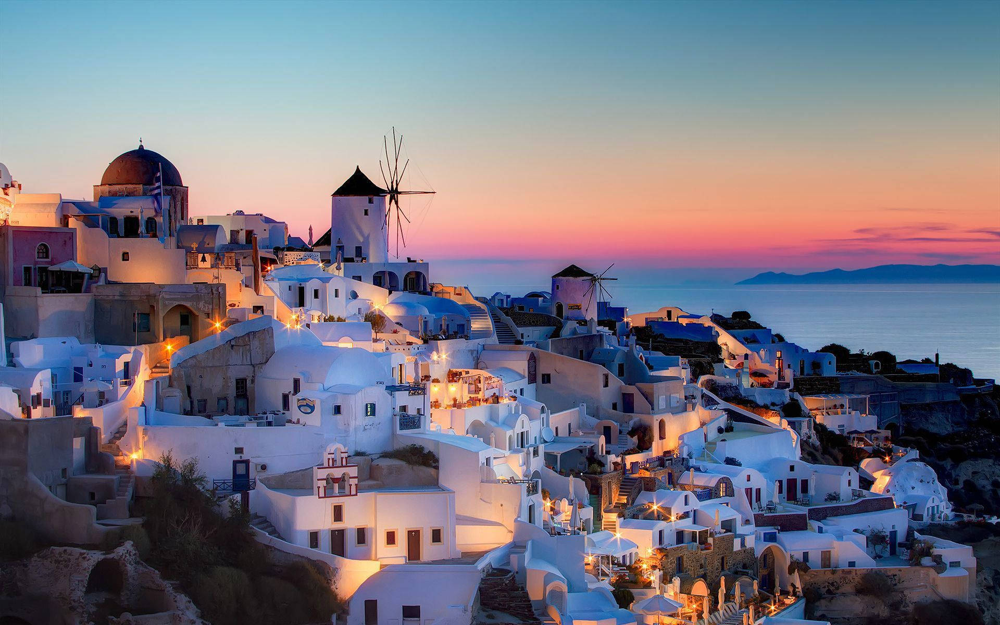

In [4]:
import tensorflow as tf
from PIL import Image

img = Image.open('/content/europe-3trlw1j33gwm6xda.jpg')
img

In [5]:
import numpy as np
imgp = np.asarray(img)
imgp.shape

(1200, 1920, 3)

In [10]:
# audio file
from scipy.io import wavfile
rate , snd = wavfile.read('/content/voice1.wav')
from IPython.display import Audio
Audio("/content/voice1.wav")



<ipython-input-13-805a0574a780>:13: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('png','pdf')


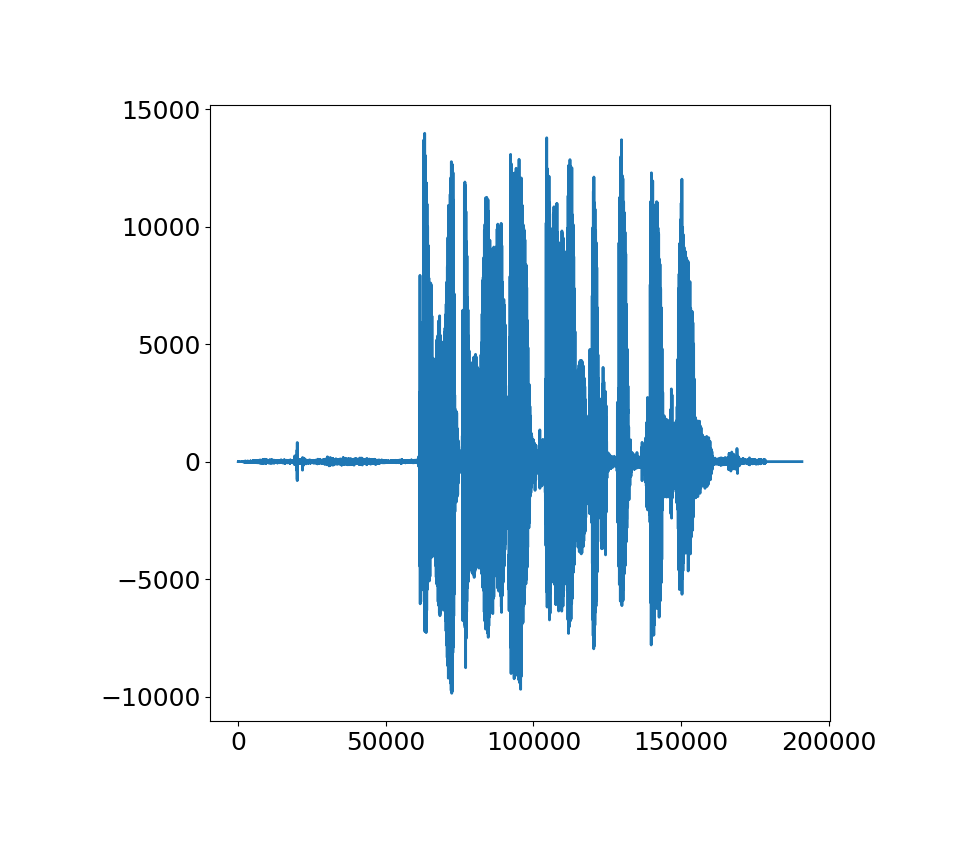

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams
from IPython.display import set_matplotlib_formats

rcParams['font.size']=18
rcParams['lines.linewidth']=2
rcParams['figure.figsize']=(8,8)
rcParams['axes.titlepad']=18
rcParams['savefig.pad_inches']=1
set_matplotlib_formats('png','pdf')
plt.plot(snd)

In [14]:
rate_song , snd_song = wavfile.read('/content/song.wav')
Audio("/content/song.wav")

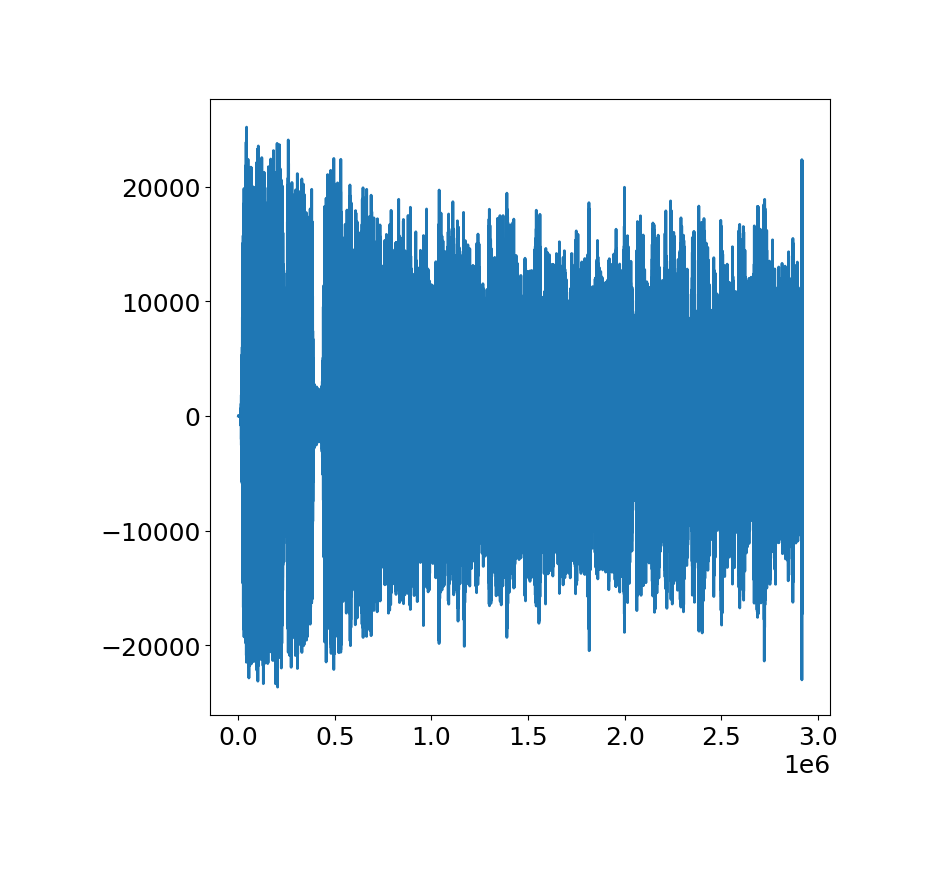

In [15]:
plt.plot(snd_song)

Text(0.5, 1.0, 'Spectrogram')

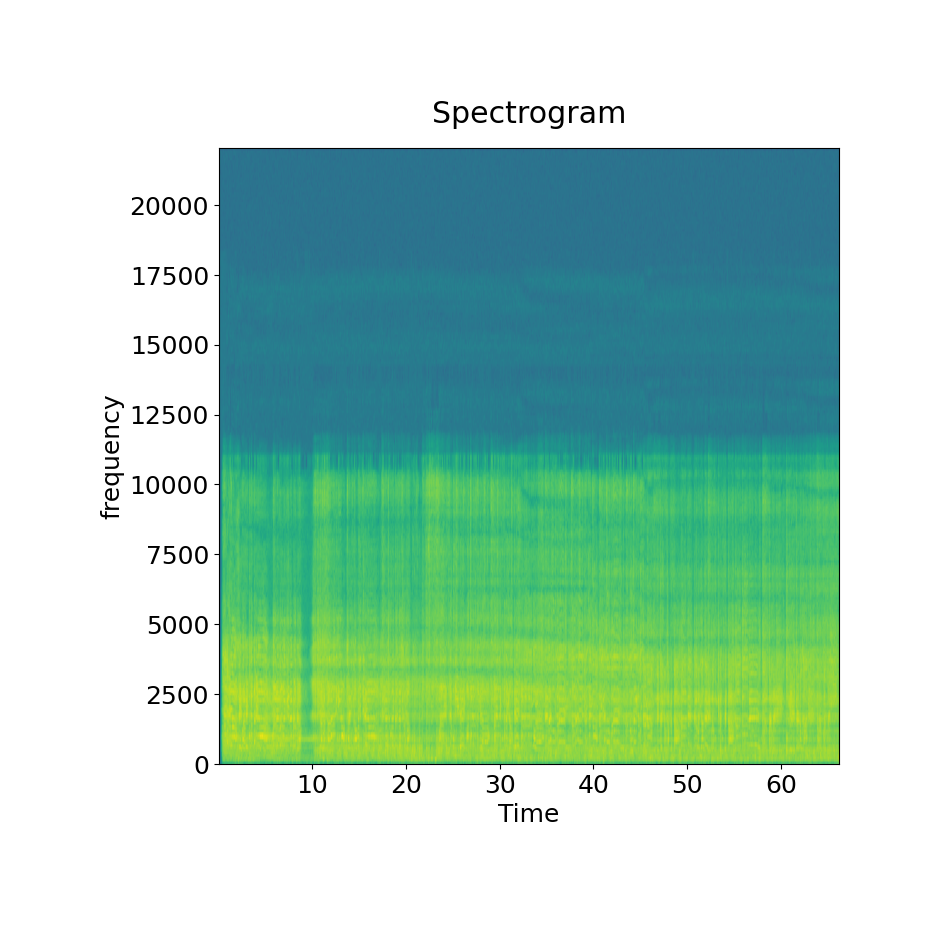

In [16]:
SPEC = plt.specgram(snd_song , NFFT=500 , Fs=44100)
plt.ylabel("frequency")
plt.xlabel('Time')
plt.title('Spectrogram')

12. Load any numeric data and apply Ridge and Lasso regressions to get 90% accuracy

In [112]:
from sklearn.datasets import fetch_california_housing

data_housing = fetch_california_housing()
sc = StandardScaler()
df_housing = pd.DataFrame(data_housing.data, columns=data_housing.feature_names)
df_housing['Target'] = data_housing.target
df_housing.head()

x_housing = df_housing.drop('Target', axis=1)
y_housing = df_housing['Target']

x_train_h , x_test_h , y_train_h , y_test_h = train_test_split(x_housing , y_housing , test_size=0.3 , random_state=5)

x_train_h_sc = sc.fit_transform(x_train_h)
x_test_h_sc = sc.transform(x_test_h)

# lasso regression
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error

lasso = Lasso(alpha=0.01)
model_lasso = lasso.fit(x_train_h_sc , y_train_h)

y_pred_lasso = model_lasso.predict(x_test_h)
print('testing score :',model_lasso.score(x_test_h_sc ,y_test_h ))

# ridge regression
from sklearn.linear_model import Ridge

ridge = Ridge(alpha=0.3)
model_ridge = ridge.fit(x_train_h_sc , y_train_h)

print('testing score for ridge :',model_ridge.score(x_test_h_sc ,y_test_h ))


testing score : 0.6090034551915228
testing score for ridge : 0.6105672567265312


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but Lasso was fitted without feature names
  warnings.warn(


In [113]:
from sklearn.linear_model import RidgeCV , LassoCV

ridgecv = RidgeCV(alphas=[0.1, 1.0, 3,6,10.0])
model_ridgecv = ridgecv.fit(x_train_h_sc , y_train_h)
print('alpha for ridge :',model_ridgecv.alpha_)
print('testing score for ridgecv :',model_ridgecv.score(x_test_h_sc ,y_test_h ))

lassocv = LassoCV(alphas=[0.1,0.01,0.004])
model_lassocv = lassocv.fit(x_train_h_sc , y_train_h)
print('alpha for lasso :',model_lassocv.alpha_)
print('testing score for lassocv :',model_lassocv.score(x_test_h_sc ,y_test_h ))

alpha for ridge : 10.0
testing score for ridgecv : 0.6106520055646278
alpha for lasso : 0.004
testing score for lassocv : 0.610935102630097


13. Load Digits dataset and apply clustering models to get its metrics

In [122]:
from sklearn.datasets import load_digits
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.model_selection import train_test_split
import pandas as pd

digits = load_digits()
X_digi = digits.data
y_digi = digits.target

X_train_digi, X_test_digi, y_train_digi, y_test_digi = train_test_split(X_digi, y_digi, test_size=0.3, random_state=42)

kmeans = KMeans(n_clusters=15, random_state=42)
kmeans.fit(X_train_digi)

y_pred_digi = kmeans.predict(X_test_digi)

silhouette = silhouette_score(X_test_digi, y_pred_digi)
adjusted_rand = adjusted_rand_score(y_test_digi, y_pred_digi)

print('Silhouette Score:', silhouette)
print('Adjusted Rand Score:', adjusted_rand)


Silhouette Score: 0.16415127388063253
Adjusted Rand Score: 0.6492603950006205


<ipython-input-124-8868a79bf585>:18: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


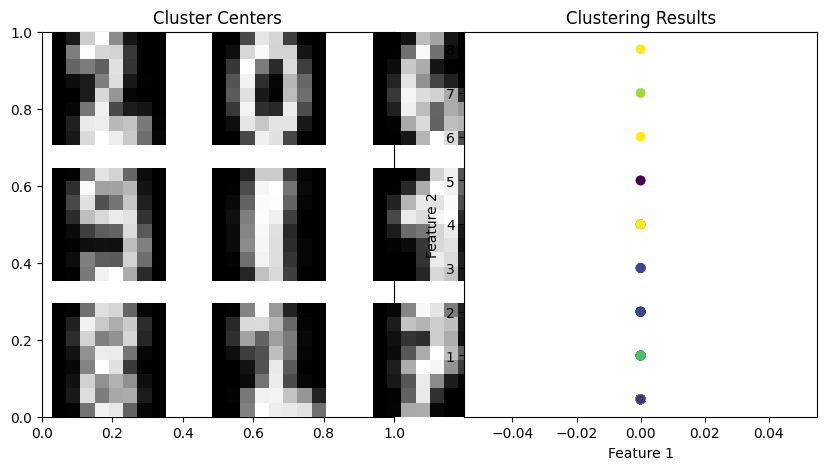

In [124]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Cluster Centers")
cluster_centers = kmeans.cluster_centers_.reshape(15, 8, 8)
for i in range(15):
    plt.subplot(3, 5, i+1)
    plt.imshow(cluster_centers[i], cmap='gray')
    plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Clustering Results")
plt.scatter(X_test_digi[:, 0], X_test_digi[:, 1], c=y_pred_digi, cmap='viridis')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

plt.tight_layout()
plt.show()

14. Implement the techniques to handle imbalanced dataset to balanced dataset with binary class data

In [133]:
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression

X, y = make_classification(n_samples=1000, n_features=8, n_classes=2,
                           weights=[0.7, 0.3], flip_y=0, random_state=42)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
# y_train[:10]

# using class weight parameter in logisticregression
model_class_weight = LogisticRegression(class_weight='balanced', random_state=9)
model_class_weight.fit(X_train, y_train)

y_pred_class_weight = model_class_weight.predict(X_test)
print("Class Weight Model Evaluation:")
print('accuracy score :',accuracy_score(y_test, y_pred_class_weight))
print('\n\nconfusion matrix :\n', confusion_matrix(y_test, y_pred_class_weight))
print(classification_report(y_test, y_pred_class_weight))

Class Weight Model Evaluation:
accuracy score : 0.8466666666666667


confusion matrix :
 [[188  29]
 [ 17  66]]
              precision    recall  f1-score   support

           0       0.92      0.87      0.89       217
           1       0.69      0.80      0.74        83

    accuracy                           0.85       300
   macro avg       0.81      0.83      0.82       300
weighted avg       0.86      0.85      0.85       300



15. Apply KNN classifier on appropriate data. Find best neighbourhood size, Indices of
neighbourhood, distances of neighbourhood by taking a random new tuple.

In [149]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

iris = load_iris()
X_knn = iris.data
y_knn = iris.target

X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split(X_knn, y_knn, test_size=0.3, random_state=42)
X_train_knn_sc = sc.fit_transform(X_train_knn)
X_test_knn_sc = sc.transform(X_test_knn)
param_grid = {'n_neighbors': range(1, 21)}

knn = KNeighborsClassifier(n_neighbors=3)

grid_search = GridSearchCV(knn, param_grid, cv=5,n_jobs=-1)
grid_search.fit(X_train_knn_sc, y_train_knn)

best_k = grid_search.best_params_['n_neighbors']
best_score = grid_search.best_score_

print("Best k:", best_k)
print("Best score:", best_score)

test_smple = [4.3,3.5,6.3,2.3]
modelll_knn = knn.fit(X_train_knn_sc , y_train_knn)

modelll_knn.predict([test_smple])

distances, indices = modelll_knn.kneighbors([test_smple])
print('best distances for new input :',distances)
print('indices of nighbors :',indices)

Best k: 3
Best score: 0.9428571428571428
best distances for new input : [[5.42457521 6.06423904 6.37261095]]
indices of nighbors : [[22  4  6]]


16. Find support vectors and their probabilities by applying SVM on any binary classification dataset.
Also find the best model to generate support vectors. Get the metrics for this trained model.
Represent its graph also.

In [160]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import numpy as np

data = load_breast_cancer()
X = data.data
y = data.target

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

svm = SVC(kernel='linear', probability=True, random_state=42)
svm.fit(X_train, y_train)

support_vectors = svm.support_vectors_
probabilities = svm.predict_proba(X_train)

y_pred = svm.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.94      0.95        63
           1       0.96      0.98      0.97       108

    accuracy                           0.96       171
   macro avg       0.97      0.96      0.96       171
weighted avg       0.96      0.96      0.96       171



17. Load a mixed type features data and apply appropriate model. Predict class for any new tuple and
its probabilities.


In [166]:
# titanic dataset
df_titanic = pd.read_csv('/content/Titanic.csv')
df_titanic.head()
df_titanic.isna().sum()

df_titanic['Age'].fillna(df_titanic['Age'].mean(), inplace=True)
df_titanic['Embarked'].fillna(df_titanic['Embarked'].mode()[0], inplace=True)

df_titanic.drop(['PassengerId', 'Name', 'Ticket', 'Cabin'], axis=1, inplace=True)

<ipython-input-166-0596f108bf9d>:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_titanic['Age'].fillna(df_titanic['Age'].mean(), inplace=True)
<ipython-input-166-0596f108bf9d>:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplac

In [169]:
df_titanic.head()

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,0,3,male,22.0,1,0,7.2500,S
1,1,1,female,38.0,1,0,71.2833,C
2,1,3,female,26.0,0,0,7.9250,S
3,1,1,female,35.0,1,0,53.1000,S
4,0,3,male,35.0,0,0,8.0500,S


In [184]:


from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df_titanic['Sex'] = le.fit_transform(df_titanic['Sex'])
df_titanic['Embarked'] = le.fit_transform(df_titanic['Embarked'])

x_titanic = df_titanic.drop('Survived', axis=1)
y_titanic = df_titanic['Survived']

print(x_titanic.head())
print(y_titanic.head())

x_train_titanic , x_test_titanic , y_train_titanic , y_test_titanic = train_test_split(x_titanic , y_titanic,test_size=0.3,random_state=0)

# applying naivebayes
from sklearn.naive_bayes import GaussianNB


gnb = GaussianNB(var_smoothing=0.000009)
model_gnb = gnb.fit(x_train_titanic , y_train_titanic)

y_pred_gnb = model_gnb.predict(x_test_titanic)

print('accuracy score :',accuracy_score(y_test_titanic, y_pred_gnb))
new_ = [[3,0,35 ,1,0,69,2]]
print('probabilities :',model_gnb.predict_proba(new_))
print('predicted class :',model_gnb.predict(new_))

   Pclass  Sex   Age  SibSp  Parch     Fare  Embarked
0       3    1  22.0      1      0   7.2500         2
1       1    0  38.0      1      0  71.2833         0
2       3    0  26.0      0      0   7.9250         2
3       1    0  35.0      1      0  53.1000         2
4       3    1  35.0      0      0   8.0500         2
0    0
1    1
2    1
3    1
4    0
Name: Survived, dtype: int64
accuracy score : 0.7910447761194029
probabilities : [[0.2317069 0.7682931]]
predicted class : [1]


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(
